# 2. When given ____, show us ____.

The objective of this challenge is to test your ability to navigate the C-PAC codebase, Google, NeuroStars, and documentation pages of popular libraries to perform basic analytic queries or processing of pre-processed fMRI data.

## Setup

For this exercise I'm using a Jupyter notebook with a python kernel. All of the libraries we'll need are pre-installed. And the data are organized as in the previous challenge.

In [1]:
import os
from glob import glob

import numpy as np
import nibabel as nib
import pandas as pd
from matplotlib import pyplot as plt
from IPython import display

In [2]:
plt.rcParams["figure.dpi"] = 150
plt.style.use("ggplot")

pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None)

In [3]:
root = "/Users/clane/Projects/CMI-Onboarding/"

os.chdir(f"{root}/data")

In [4]:
! tree -L 3 .

.
├── C-PAC_Derivatives
│   ├── abcd-options
│   │   └── sub-NDARAD481FXF_ses-1
│   └── preproc
│       ├── cpac_data_config_idx-14_2022-08-25T15-15-35Z.yml
│       ├── cpac_pipeline_config_2022-08-25T15-15-35Z.yml
│       ├── cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml
│       ├── log
│       ├── output
│       └── working
├── Raw_Data
│   ├── HNU_1
│   │   └── sub-0025429
│   └── Site-SI
│       └── sub-NDARAD481FXF
└── osfstorage-archive.zip

12 directories, 4 files


## C-PAC output directory inspection

When given the output/working directories from C-PAC's minimal-preproc configuration, show us...

### Configs

> The complete configuration used and its differences from the default pipeline This can be found inside the working directory, across a set of configuration files.

The complete YAML config files for the `preproc` processing run can be found in `C-PAC_Derivatives/preproc/`.

We can compare the minimal config file with the base `preproc` config available on [github](https://github.com/FCP-INDI/C-PAC/blob/main/CPAC/resources/configs/pipeline_config_preproc.yml). I'll specifically compare with the config from commit [9453398](https://github.com/FCP-INDI/C-PAC/commit/9453398fefcdc83bea2b82727c52b5d140a69989). I'll download the base config with `wget` and compare the files with `git diff` to get a nice readable diff output.

The differences between the base and modified configs are not too bad. Although some sections with differences give me pause, e.g. `symmetric_registration` and `segmentation`. I would be more at ease if the only differences were run-specific (e.g. paths, resource requirements).

My guess is there is a work-in-progress update to the config (v1.8.4.dev) that was used to process these data but isn't on github yet.

In [5]:
! rm ../outputs/pipeline_config_preproc.yml* 2>/dev/null

! wget -P ../outputs/ \
    https://raw.githubusercontent.com/FCP-INDI/C-PAC/9453398fefcdc83bea2b82727c52b5d140a69989/CPAC/resources/configs/pipeline_config_preproc.yml

--2022-10-06 10:30:58--  https://raw.githubusercontent.com/FCP-INDI/C-PAC/9453398fefcdc83bea2b82727c52b5d140a69989/CPAC/resources/configs/pipeline_config_preproc.yml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7620 (7.4K) [text/plain]
Saving to: ‘../outputs/pipeline_config_preproc.yml’

pipeline_config_pre 100%[===================>]   7.44K  --.-KB/s    in 0s      

2022-10-06 10:30:58 (43.0 MB/s) - ‘../outputs/pipeline_config_preproc.yml’ saved [7620/7620]



In [6]:
! git diff --no-index ../outputs/pipeline_config_preproc.yml \
    C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml

diff --git a/../outputs/pipeline_config_preproc.yml b/C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml
index 9a465d2..b46253a 100644
--- a/../outputs/pipeline_config_preproc.yml
+++ b/C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml
@@ -1,7 +1,7 @@
 %YAML 1.1
 ---
 # CPAC Pipeline Configuration YAML file
-# Version 1.8.4
+# Version 1.8.4.dev
 #
 # http://fcp-indi.github.io for more info.
 #
@@ -9,21 +9,47 @@
 
 FROM: default
 
-
 pipeline_setup: 
+
   # Name for this pipeline configuration - useful for identification.
   pipeline_name: cpac_preproc
 
+  output_directory: 
+
+    # Directory where C-PAC should write out processed data, logs, and crash reports.
+    # - If running in a container (Singularity/Docker), you can simply set this to an arbitrary
+    #   name like '/outputs', and then map (-B/-v) your desired output directory to that label.
+    # - If running outside a container, this should be a full path to a directory.



Next I'll compare the minimal config (`*_min.yml`) with the full config (`*.yml`).

First I call `git diff` with the `--stat` option just to count the line differences. Then I'll look at the diffed lines. Note that the minimal config is a strict subset of the full config. I.e. there are only insertions, no deletions.

In [7]:
! git diff --no-index --stat \
    C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml \
    C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z.yml

 ... cpac_pipeline_config_2022-08-25T15-15-35Z.yml} | 1481 +++++++++++++++++++-
 1 file changed, 1480 insertions(+), 1 deletion(-)


In [8]:
! git diff --no-index --color=always \
    C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml \
    C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z.yml | \
    (head -n 50; echo "..."; tail -n 50)

diff --git a/C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml b/C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z.yml
index b46253a..1473069 100644
--- a/C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z_min.yml
+++ b/C-PAC_Derivatives/preproc/cpac_pipeline_config_2022-08-25T15-15-35Z.yml
@@ -22,6 +22,42 @@ pipeline_setup:
     # - If running outside a container, this should be a full path to a directory.
     path: /output/output
 
+    # (Optional) Path to a BIDS-Derivatives directory that already has outputs.
+    #   - This option is intended to ingress already-existing resources from an output
+    #     directory without writing new outputs back into the same directory.
+    #   - If provided, C-PAC will ingress the already-computed outputs from this directory and
+    #     continue the pipeline from where they leave off.
+    #   - If left as 'None', C-PAC will ingress any already-computed outputs from the
+    #   

### Callback log

> The a) longest and b) most memory-consuming tasks in the pipeline This can be found by looking through the callback.log in the working directory, and a tool such as this one can help with the parsing and sorting of the file.

For this I'll use `pandas` to read and analyze the log file, which is in [JSON lines](https://jsonlines.org/) format.

In [9]:
df = pd.read_json(
    "C-PAC_Derivatives/preproc/log/pipeline_cpac_preproc/sub-0025429_ses-1/callback.log", lines=True
)

df["start"] = pd.to_datetime(df["start"])
df["finish"] = pd.to_datetime(df["finish"])
df["elapsed"] = df["finish"] - df["start"]

df.tail(2)

,id,hash,start,finish,runtime_threads,runtime_memory_gb,estimated_memory_gb,num_threads,elapsed
1015,cpac_sub-0025429_ses-1.carpet_seg_220.carpet_plot,a8e140638ddeb11b90549c6ea64bdaae,2022-08-25 20:12:50.019635,2022-08-25 20:12:52.652067,2.0,0.807659,4.0,1.0,0 days 00:00:02.632432
1016,cpac_sub-0025429_ses-1.sinker_space-template_desc-preproc-1_bold_182,34df9b23661ed143c3c4432921e74193,2022-08-25 20:12:51.955055,2022-08-25 20:12:52.161116,0.0,0.237961,2.0,1.0,0 days 00:00:00.206061


Longest running tasks

In [10]:
df.sort_values("elapsed", ascending=False).head(4)

,id,hash,start,finish,runtime_threads,runtime_memory_gb,estimated_memory_gb,num_threads,elapsed
815,cpac_sub-0025429_ses-1.segment_64,7f37f9babcaf82d1db6263b51984b48c,2022-08-25 20:04:29.458474,2022-08-25 20:08:36.716777,4.0,1.507805,3.495831,1.0,0 days 00:04:07.258303
692,cpac_sub-0025429_ses-1.anat_skullstrip_45,ac7ef85e2a1a84f8a60789bf6fc0dd48,2022-08-25 20:01:35.360384,2022-08-25 20:04:20.052839,6.0,0.563110,2.000000,1.0,0 days 00:02:44.692455
860,cpac_sub-0025429_ses-1.func_to_anat_bbreg_120.bbreg_func_to_anat,e597830dbb66d0def5c1578ffdb61f5d,2022-08-25 20:08:39.713876,2022-08-25 20:10:22.733129,1.0,0.576317,2.000000,1.0,0 days 00:01:43.019253
768,cpac_sub-0025429_ses-1.ANTS_T1_to_template_51.cpac_sub-0025429_ses-1.anat_mni_ants_register.calc_ants_warp,b0d2c94467316a8b40db1bf41350db28,2022-08-25 20:04:27.436744,2022-08-25 20:06:06.070234,1.0,1.118908,2.814818,1.0,0 days 00:01:38.633490


Most memory consuming tasks

In [11]:
df.sort_values("runtime_memory_gb", ascending=False).head(4)

,id,hash,start,finish,runtime_threads,runtime_memory_gb,estimated_memory_gb,num_threads,elapsed
930,cpac_sub-0025429_ses-1.nuisance_regressors_Regressor-1_136.aCompCor_DetrendPC,1827ef75cb17299c76eb9faaa08bddf4,2022-08-25 20:11:13.860045,2022-08-25 20:11:24.557195,20.0,4.548512,2.642692,1.0,0 days 00:00:10.697150
929,cpac_sub-0025429_ses-1.nuisance_regressors_Regressor-2_136.aCompCor_DetrendPC,1827ef75cb17299c76eb9faaa08bddf4,2022-08-25 20:11:13.858174,2022-08-25 20:11:24.562645,23.0,4.530048,2.642692,1.0,0 days 00:00:10.704471
925,cpac_sub-0025429_ses-1.nuisance_regressors_Regressor-2_136.Functional_2mm_flirt,caf85785cf4dca97a3b2f6692406ac9b,2022-08-25 20:10:23.810948,2022-08-25 20:11:12.884286,1.0,3.080265,1.813846,1.0,0 days 00:00:49.073338
926,cpac_sub-0025429_ses-1.nuisance_regressors_Regressor-1_136.Functional_2mm_flirt,caf85785cf4dca97a3b2f6692406ac9b,2022-08-25 20:10:23.911008,2022-08-25 20:11:12.659198,1.0,3.079681,1.813846,1.0,0 days 00:00:48.748190


### QC plots

> All quality control (QC) plots generated throughout executions. These can be found in the output directory.


We'll quickly get a list of all the plots and paste them together in html for the notebook. Not pretty but functional.

In [12]:
plots = sorted(glob("C-PAC_Derivatives/preproc/output/cpac_cpac_preproc/sub-0025429_ses-1/*/*.png"))

html = ""
for fname in plots:
    base = os.path.basename(fname)
    base, _ = os.path.splitext(base)
    name = base.split("_")[-1]
    html += f'<h4>{name}</h4><img src="../data/{fname}" alt="{base}" width=400>'
display.HTML(html)

## Analyzing voxelwise timeseries

When given voxelwise time series data, show us...

### Voxelwise connectomes

> **Voxelwise connectomes**. Either an existing tool or manual-approach can be taken. If doing it manually, the broad strokes would be to: 1) load the functional data, 2) apply an already computed brain mask to the data, 3) compute the pairwise correlation across all retained values. There are tools to do each of these things in Python, such as Nibabel, Nilearn, and Numpy, respectively. The result should be an N x N matrix where N is the number of voxels in the brain mask. If you prefer to work in the Bash shell directly, consider tools like AFNI or FSL. Note that if the code takes too long to run, you can instead validate the various pieces independently on small simulated data.

For this exercise, we'll compute manually for instructiveness. But this functionality is also well implemented in [nilearn](https://nilearn.github.io/stable/index.html)

We'll load the `preproc-1` bold data and mask in subject native space, and confirm that the mask aligns well with the functional.

In [13]:
func = nib.load(
    "C-PAC_Derivatives/preproc/output/cpac_cpac_preproc/sub-0025429_ses-1/func/sub-0025429_ses-1_task-rest_run-1_desc-preproc-1_bold.nii.gz"
)

mask = nib.load(
    "C-PAC_Derivatives/preproc/output/cpac_cpac_preproc/sub-0025429_ses-1/func/sub-0025429_ses-1_task-rest_run-1_space-bold_desc-brain_mask.nii.gz"
)

In [14]:
func_data = func.get_fdata()
mask_data = mask.get_fdata()
mask_data = mask_data > 0

/Users/clane/miniconda3/envs/neuro/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  import sys


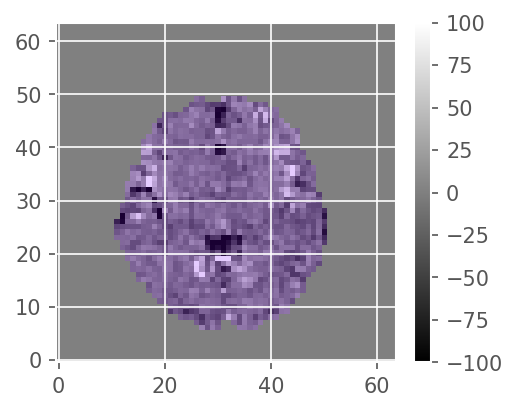

In [15]:
f, ax = plt.subplots(figsize=(4, 3))

z = 19

im = plt.imshow(func_data[:, :, z, 0].T, vmin=-100, vmax=100, cmap="gray", origin="lower")
plt.imshow(np.where(mask_data[:, :, z], 1.0, np.nan).T, cmap="rainbow", origin="lower", alpha=0.2)
plt.colorbar(im, fraction=0.046, pad=0.04)

The mask seems to fit well. Indeed, this mask has already been applied to these functional data. I confirm this by counting the identically zero voxels inside and outside the mask.

In [16]:
vox_data = func_data[mask_data, :]
outside_data = func_data[~mask_data, :]

print("Vox data shape:", vox_data.shape)
print("Outside data shape:", outside_data.shape)

Vox data shape: (30735, 300)
Outside data shape: (145393, 300)


In [17]:
print("Vox data zero fraction:", np.mean(vox_data == 0))
print("Outside data zero fraction:", np.mean(outside_data == 0))

Vox data zero fraction: 0.0
Outside data zero fraction: 1.0


Now we'll compute the correlations. But first we'll save some space by downsampling the voxelwise time series. Without this step, computing the dense N x N correlation matrix might overburden our system memory.

(Nb: out-of-core methods such as implemented in [Dask](https://www.dask.org/) can be used to scale to very dense functional connectivity analyses.)

In [18]:
n = len(vox_data)
estimated_memory_gb = (8 * n ** 2) / 1e9
print(estimated_memory_gb)

7.5571218


In [19]:
# subsample voxels to reduce memory load
rng = np.random.default_rng(2022)

indices = np.sort(rng.choice(len(vox_data), 1000, replace=False))
vox_subsamp_data = vox_data[indices]

In [20]:
print("Vox subsamp data shape:", vox_subsamp_data.shape)

Vox subsamp data shape: (1000, 300)


In [21]:
# equivalent to np.corrcoef (checked)
def corrcoef(x):
    x = x - np.mean(x, axis=1, keepdims=True)
    x /= np.linalg.norm(x, axis=1, keepdims=True)
    corr = x @ x.T
    return corr

In [22]:
corr = corrcoef(vox_subsamp_data)

In [23]:
print("Corr shape:", corr.shape)

Corr shape: (1000, 1000)


In [24]:
# get just upper triangle values
corr_triu = corr[np.triu_indices(corr.shape[0], k=1)]

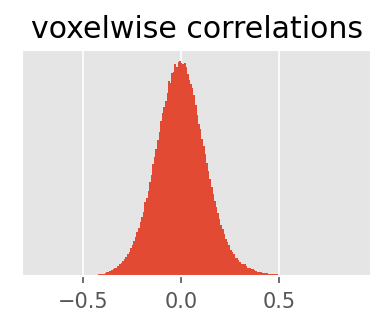

In [25]:
f, ax = plt.subplots(figsize=(3, 2))
plt.hist(corr_triu, bins=200)
plt.title("voxelwise correlations")
plt.yticks([])
plt.show()

The distribution of pairwise voxel correlations is almost perfectly normal!

### Parcellated time series

> **Parcellated time series data with each of the CC200 and Schaefer 200 atlases.** Similar to the above, though you can remove step 3 and you would be masking by a parcellations, which can each be found in our Templates repository, the CBIG repos, or Neuroparc. The exact commands in Nilearn that you would use may also vary slightly.

For this exercise I'll use `nilearn` to save some effort.

First I download the atlases from the relevant github repos.

In [26]:
from nilearn.plotting import plot_roi
from nilearn.maskers import NiftiLabelsMasker

In [27]:
! rm ../outputs/CC200.nii.gz 2>/dev/null

! wget -P ../outputs/ \
    https://github.com/FCP-INDI/C-PAC_templates/raw/main/atlases/label/Human/CC200.nii.gz

--2022-10-06 10:31:06--  https://github.com/FCP-INDI/C-PAC_templates/raw/main/atlases/label/Human/CC200.nii.gz
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/FCP-INDI/C-PAC_templates/main/atlases/label/Human/CC200.nii.gz [following]
--2022-10-06 10:31:06--  https://media.githubusercontent.com/media/FCP-INDI/C-PAC_templates/main/atlases/label/Human/CC200.nii.gz
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12338 (12K) [application/octet-stream]
Saving to: ‘../outputs/CC200.nii.gz’

CC200.nii.gz        100%[===================>]  12.05K  --.-KB/s    in 0s      

2022-10-06 10:31

In [28]:
! rm ../outputs/Schaefer2018_* 2>/dev/null

! wget -P ../outputs/ \
    https://github.com/ThomasYeoLab/CBIG/raw/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/MNI/Schaefer2018_200Parcels_17Networks_order_FSLMNI152_2mm.nii.gz

--2022-10-06 10:31:08--  https://github.com/ThomasYeoLab/CBIG/raw/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/MNI/Schaefer2018_200Parcels_17Networks_order_FSLMNI152_2mm.nii.gz
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ThomasYeoLab/CBIG/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/MNI/Schaefer2018_200Parcels_17Networks_order_FSLMNI152_2mm.nii.gz [following]
--2022-10-06 10:31:08--  https://raw.githubusercontent.com/ThomasYeoLab/CBIG/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/MNI/Schaefer2018_200Parcels_17Networks_order_FSLMNI152_2mm.nii.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githu

Next I load the images and view their shapes and affine transforms.

Note that the shapes and transforms are fairly different. However we assume all data are in "MNI" space, and therefore consistent. Nilearn will handle the details of resampling the data to exactly the same grid.

In [29]:
func = nib.load(
    "C-PAC_Derivatives/preproc/output/cpac_cpac_preproc/sub-0025429_ses-1/func/sub-0025429_ses-1_task-rest_run-1_space-template_desc-preproc-1_bold.nii.gz"
)

mean_func = nib.load(
    "C-PAC_Derivatives/preproc/output/cpac_cpac_preproc/sub-0025429_ses-1/func/sub-0025429_ses-1_task-rest_run-1_space-template_desc-mean_bold.nii.gz"
)
    
cc200 = nib.load("../outputs/CC200.nii.gz")

schaefer200 = nib.load("../outputs/Schaefer2018_200Parcels_17Networks_order_FSLMNI152_2mm.nii.gz")

In [30]:
print("Standard space func:\n", func.shape, "\n", func.affine)
print("Standard space mean func:\n", mean_func.shape, "\n", mean_func.affine)
print("CC200:\n", cc200.shape, "\n", cc200.affine)
print("Schaefer200:\n", schaefer200.shape, "\n", schaefer200.affine)

Standard space func:
 (61, 73, 61, 300) 
 [[  -3.   -0.   -0.   90.]
 [  -0.    3.   -0. -126.]
 [   0.    0.    3.  -72.]
 [   0.    0.    0.    1.]]
Standard space mean func:
 (61, 73, 61) 
 [[  -3.    0.    0.   90.]
 [   0.    3.    0. -126.]
 [   0.    0.    3.  -72.]
 [   0.    0.    0.    1.]]
CC200:
 (63, 75, 61) 
 [[  -3.   -0.   -0.   93.]
 [  -0.    3.   -0. -129.]
 [   0.    0.    3.  -72.]
 [   0.    0.    0.    1.]]
Schaefer200:
 (91, 109, 91) 
 [[  -2.    0.    0.   90.]
 [   0.    2.    0. -126.]
 [   0.    0.    2.  -72.]
 [   0.    0.    0.    1.]]


We can check that the atlases align with the functional data using `nilearn.plotting.plot_roi`.

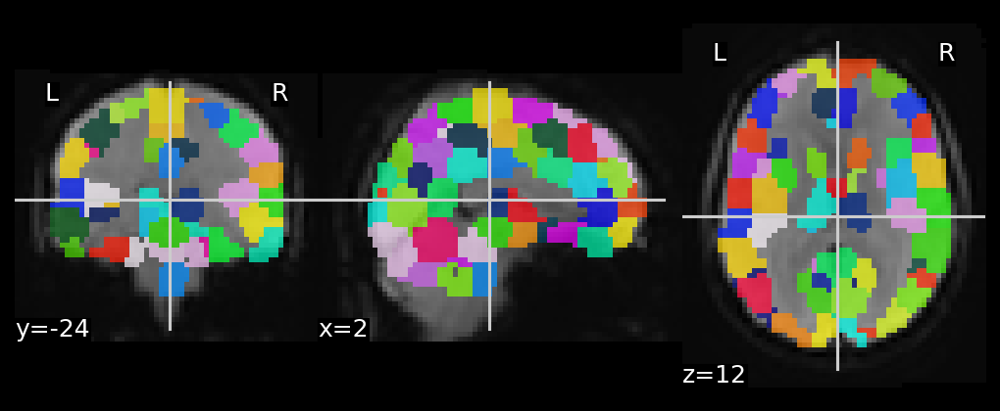

In [31]:
plot_roi(cc200, bg_img=mean_func)

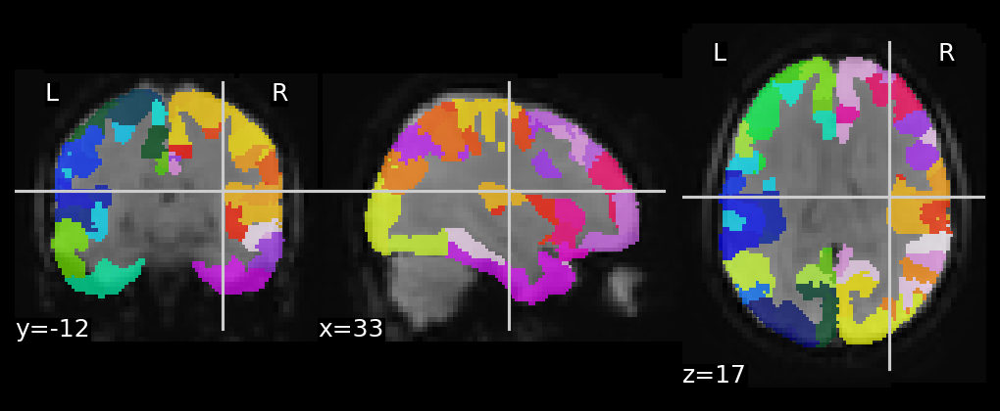

In [32]:
plot_roi(schaefer200, bg_img=mean_func)

Next, we use `NiftiLabelsMasker` from Nilearn to extract the average time series for each roi in each atlas.

In [33]:
masker = NiftiLabelsMasker(labels_img=cc200)
masker.fit(func)
cc200_func_data = masker.transform(func)

In [34]:
print("CC200 functional time series:", cc200_func_data.shape)

CC200 functional time series: (300, 200)


In [35]:
masker = NiftiLabelsMasker(labels_img=schaefer200)
masker.fit(func)
schaefer200_func_data = masker.transform(func)

In [36]:
print("Schaefer functional time series:", schaefer200_func_data.shape)

Schaefer functional time series: (300, 200)


### Parcellated connectomes

> **Parcellated connectomes for the above atlases**. You essentially would combine the two approaches here. A check to make sure you are doing this correctly is that your matrix at the end should be N x N where N corresponds to the number of unique values in the parcellation used.

Finally, we compute and visualize the roi-to-roi correlation matrices, i.e. connectomes.

Note that you can see clear structure in the matrices, especially for Schaefer 200.

In [37]:
# note transpose bc in this case data are (T, N)
cc200_corr = corrcoef(cc200_func_data.T)
schaefer200_corr = corrcoef(schaefer200_func_data.T)

In [38]:
rng = np.random.default_rng(2022)
random_corr = corrcoef(rng.normal(size=cc200_func_data.T.shape))

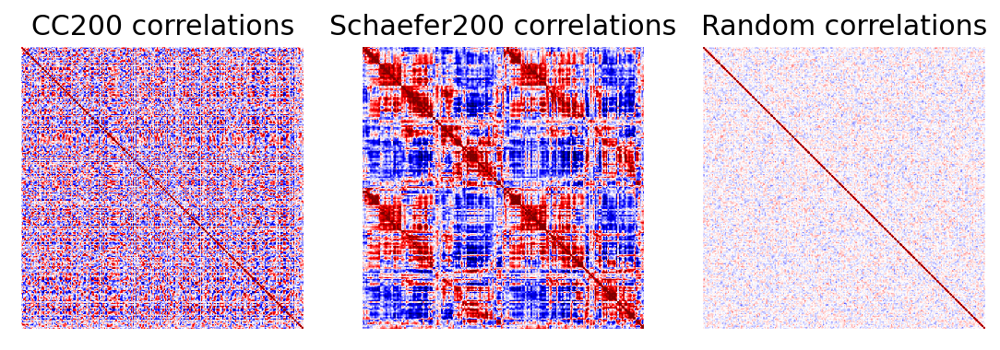

In [39]:
f, axs = plt.subplots(1, 3, figsize=(9, 3))

for ii, (corr, label) in enumerate(
    zip([cc200_corr, schaefer200_corr, random_corr], ["CC200", "Schaefer200", "Random"])
):  
    plt.sca(axs[ii])
    im = plt.imshow(corr, cmap="seismic", vmin=-0.6, vmax=0.6)
    plt.xticks([])
    plt.yticks([])
    plt.title(f"{label} correlations")
    
plt.show()

## Analyzing surface vertexwise time series

When given vertexwise time series and surface data, show us...

### Average surface data

> **Average values across time for each vertex, visualized on the surface.** The easiest path forward in these tasks is probably to look at the documentation for wb_command, which provides a number of convenience utilities. One important note when working with surface-based functional data is that they include "pre-extensions," e.g., *dscalar.nii is not the same as *dtseries.nii.

First I'll download the HCP 32k fsLR left hemisphere template surface from [template flow](https://www.templateflow.org/browse/). I'll use this for visualization.

In [40]:
! rm ../outputs/tpl-fsLR_den-32k_hemi-L_inflated.surf.gii 2>/dev/null

! wget -P ../outputs/ \
    https://templateflow.s3.amazonaws.com/tpl-fsLR/tpl-fsLR_den-32k_hemi-L_inflated.surf.gii

--2022-10-06 10:31:20--  https://templateflow.s3.amazonaws.com/tpl-fsLR/tpl-fsLR_den-32k_hemi-L_inflated.surf.gii
Resolving templateflow.s3.amazonaws.com (templateflow.s3.amazonaws.com)... 54.231.140.73
Connecting to templateflow.s3.amazonaws.com (templateflow.s3.amazonaws.com)|54.231.140.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 726967 (710K) [text/xml]
Saving to: ‘../outputs/tpl-fsLR_den-32k_hemi-L_inflated.surf.gii’

tpl-fsLR_den-32k_he 100%[===================>] 709.93K  --.-KB/s    in 0.08s   

2022-10-06 10:31:20 (8.33 MB/s) - ‘../outputs/tpl-fsLR_den-32k_hemi-L_inflated.surf.gii’ saved [726967/726967]



Load the surface mesh with `nilearn` and view its shape.

Note that a surface data structure contains two arrays

* a `coordinates` (aka vertices) array, shape `(num_verts, 3)` containing the XYZ coordinates of each vertex
* a `faces` array, shape `(num_triangles, 3)` containing the 3 vertex indices making up each triangular face.

Together these determine the triangulated surface mesh.

In [41]:
from nilearn import surface
from nilearn import plotting

In [42]:
inflated = surface.load_surf_mesh(
    "../outputs/tpl-fsLR_den-32k_hemi-L_inflated.surf.gii"
)

In [43]:
print("Surface shape:", inflated.coordinates.shape, inflated.faces.shape)

Surface shape: (32492, 3) (64980, 3)


Next I load the surface mapped functional data. These data are stored in [CIFTI-2](https://balsa.wustl.edu/about/fileTypes) format within a Nifti container. Note that although the file ends in `.nii`, the data are not your typical Nifti data.

I copied the approach to read the data from [this notebook](https://nbviewer.org/github/neurohackademy/nh2020-curriculum/blob/master/we-nibabel-markiewicz/NiBabel.ipynb) which I found via [this Neurostars thread](https://neurostars.org/t/separate-cifti-by-structure-in-python/17301/2).

In [44]:
cifti_func = nib.cifti2.load(
    "C-PAC_Derivatives/abcd-options/sub-NDARAD481FXF_ses-1/Derivatives/func/sub-NDARAD481FXF_1_task-task-rest_space-fsLR_den-32k_bold-dtseries.nii"
)

In [45]:
# adapted from:
# https://nbviewer.org/github/neurohackademy/nh2020-curriculum/blob/master/we-nibabel-markiewicz/NiBabel.ipynb
# via:
# https://neurostars.org/t/separate-cifti-by-structure-in-python/17301/2

def surf_data_from_cifti(cifti, surf_name):
    axis = get_brain_model_axis(cifti)
    assert isinstance(axis, nib.cifti2.BrainModelAxis)
    for name, data_indices, model in axis.iter_structures():
        if name == surf_name:
            data = cifti.get_fdata().T[data_indices]
            vtx_indices = model.vertex
            surf_data = np.zeros((vtx_indices.max() + 1,) + data.shape[1:], dtype=data.dtype)
            surf_data[vtx_indices] = data
            return surf_data
    raise ValueError(f"No structure named {surf_name}")

def get_brain_model_axis(cifti):
    bmax = None
    for ii in range(cifti.ndim):
        axis = cifti.header.get_axis(ii)
        if isinstance(axis, nib.cifti2.BrainModelAxis):
            bmax = axis
            break
    return bmax 

In [46]:
surf_data = surf_data_from_cifti(cifti_func, "CIFTI_STRUCTURE_CORTEX_LEFT")

In [47]:
print("Surface functional data shape:", surf_data.shape)

Surface functional data shape: (32492, 420)


Now I take the average across time points and plot the map using `nilearn` with the plotly backend for interactivity.

In [48]:
surf_data_avg = surf_data.mean(axis=1)

In [49]:
f = plotting.plot_surf_stat_map(
    inflated,
    surf_data_avg,
    title='Mean activity',
    engine="plotly",
)

/Users/clane/miniconda3/envs/neuro/lib/python3.7/site-packages/nilearn/plotting/js_plotting_utils.py:81: UserWarning: vmin cannot be chosen when cmap is symmetric
  warnings.warn('vmin cannot be chosen when cmap is symmetric')


----------------------------------------
Exception happened during processing of request from ('127.0.0.1', 54691)
Traceback (most recent call last):
  File "/Users/clane/miniconda3/envs/neuro/lib/python3.7/socketserver.py", line 316, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/Users/clane/miniconda3/envs/neuro/lib/python3.7/socketserver.py", line 347, in process_request
    self.finish_request(request, client_address)
  File "/Users/clane/miniconda3/envs/neuro/lib/python3.7/socketserver.py", line 360, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/Users/clane/miniconda3/envs/neuro/lib/python3.7/socketserver.py", line 720, in __init__
    self.handle()
  File "/Users/clane/miniconda3/envs/neuro/lib/python3.7/http/server.py", line 426, in handle
    self.handle_one_request()
  File "/Users/clane/miniconda3/envs/neuro/lib/python3.7/http/server.py", line 414, in handle_one_request
    method()
  File "/Users

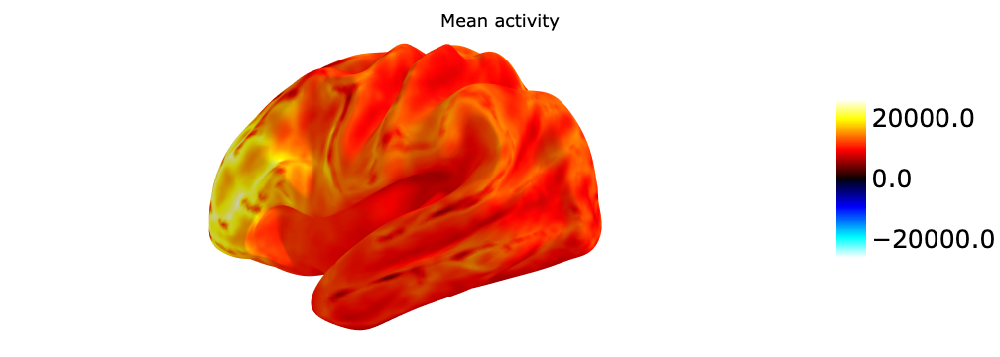

In [50]:
f.show()

### Parcellated time series data

> **Parcellated time series data, returning an average, using the Schaefer 200 parcellation.** Same as the above, and note that the surface and volume-based version of the template are in distinct file formats, so you will need to grab the correct one from the repository linked above.

First I'll download the appropriate fsLR 32k surface parcels.

In [51]:
! rm ../outputs/Schaefer2018_200Parcels_17Networks_order.dlabel.nii 2>/dev/null

! wget -P ../outputs/ \
    https://github.com/ThomasYeoLab/CBIG/raw/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/HCP/fslr32k/cifti/Schaefer2018_200Parcels_17Networks_order.dlabel.nii

--2022-10-06 10:31:25--  https://github.com/ThomasYeoLab/CBIG/raw/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/HCP/fslr32k/cifti/Schaefer2018_200Parcels_17Networks_order.dlabel.nii
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ThomasYeoLab/CBIG/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/HCP/fslr32k/cifti/Schaefer2018_200Parcels_17Networks_order.dlabel.nii [following]
--2022-10-06 10:31:26--  https://raw.githubusercontent.com/ThomasYeoLab/CBIG/master/stable_projects/brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/HCP/fslr32k/cifti/Schaefer2018_200Parcels_17Networks_order.dlabel.nii
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.co

I'll load the parcel label file using the same method as before.

In [52]:
cifti_schaefer200 = nib.cifti2.load(
    "../outputs/Schaefer2018_200Parcels_17Networks_order.dlabel.nii"
)

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [53]:
surf_schaefer200 = surf_data_from_cifti(cifti_schaefer200, "CIFTI_STRUCTURE_CORTEX_LEFT")

To mix things up, I'll compute the parcellated time series manually this time. One concise way to do it is as a matrix multiplication:

1. Construct a projection matrix `P` that is `(num_verts, num_parcels)` where the ith column indicates the vertices belonging to the ith parcel and sums to 1. Specifically, `P[:, i]` with have value `1 / n_i` for vertices belonging to the ith parcel, and 0 otherwise, where `n_i` is the size of parcel i.

2. Apply the (transposed) projection to the surface functional data, shape `(num_verts, num_time_points)`, resulting in a parcellated time series, shape `(num_parcels, num_time_points)`.

In [54]:
def label_to_onehot(label):
    """
    one hot encoding of a label vector
    """
    label = label.astype("int32").flatten()
    m = len(label)
    n = int(label.max() + 1)
    onehot = np.zeros((m, n))
    onehot[np.arange(m), label] = 1.0
    return onehot

In [55]:
surf_schaefer200_oh = label_to_onehot(surf_schaefer200)

surf_schaefer200_counts = surf_schaefer200_oh.sum(axis=0)
surf_schaefer200_proj = surf_schaefer200_oh / surf_schaefer200_counts

In [56]:
surf_schaefer200_data = surf_schaefer200_proj.T @ surf_data

In [57]:
print("Projection shape:", surf_schaefer200_proj.shape)
print("Surface data shape:", surf_data.shape)
print("Parcellated data shape:", surf_schaefer200_data.shape)

Projection shape: (32492, 101)
Surface data shape: (32492, 420)
Parcellated data shape: (101, 420)


Finally, compute the pairwise correlation and visualize the connectome.

In [58]:
surf_schaefer200_corr = corrcoef(surf_schaefer200_data)

/Users/clane/miniconda3/envs/neuro/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



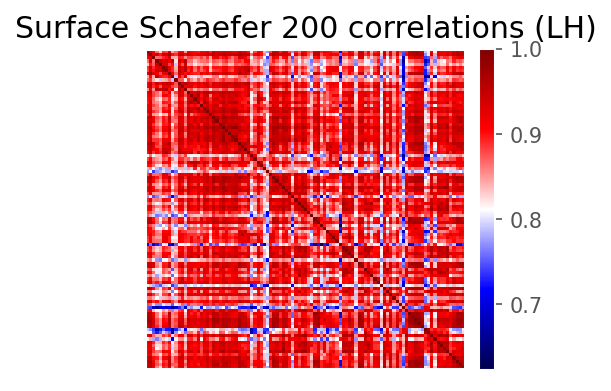

In [59]:
f, ax = plt.subplots(figsize=(3, 3))
 
plt.imshow(surf_schaefer200_corr, cmap="seismic")
plt.xticks([])
plt.yticks([])
plt.title(f"Surface Schaefer 200 correlations (LH)")
plt.colorbar(fraction=0.046, pad=0.04)

plt.show()

In this plot, there is still structure in the correlation matrix. However the correlations are overwhelmingly positive. One possible explanation is that the data contain a strong shared global signal component. Regressing out this global signal is a common (although hotly debated) preprocessing step. However, it's possible that it was left out in this pipeline (which, importantly, differs from the previous) (**TODO:** check).

Another possibility is that there is a mistake somewhere in data loading and processing.. If we wanted to get to the bottom of this, I might check over the steps more carefully and try computing the same result independently, e.g. with HCP workbench.

## Running C-PAC

When given a BIDS input dataset, show us...

**TODO**